## 목표
---
1. **ResNet-34, ResNet-50 모델 구현이 정상적으로 진행되었는가?**  
    - 블록함수 구현이 제대로 진행되었으며 구현한 모델의 summary가 예상된 형태로 출력되었다.
2. **구현한 ResNet 모델을 활용하여 Image Classification 모델 훈련이 가능한가?**
    - cats_vs_dogs 데이터셋으로 학습시 몇 epoch동안 안정적으로 loss 감소가 진행 확인되었다.
3. **Ablation Study 결과가 바른 포맷으로 제출되었는가?**
    - ResNet-34, ResNet-50 각각 plain모델과 residual모델을 동일한 epoch만큼 학습시켰을 때의 validation accuracy 기준으로 Ablation Study 결과표가 작성되었다.

---


## STEP 0. 라이브러리 불러오기
---

In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tensorflow import keras
import os
import shutil
import zipfile
import glob
import pandas as pd
import warnings
import tensorflow_datasets as tfds
from tensorflow.python.client import device_lib
warnings.filterwarnings("ignore")

In [2]:
! pip install tensorflow-datasets

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


## STEP 1. ResNet 기본 블록 구성하기
---
금번에 만들어볼 ResNet-34와 ResNet-50 블록의 공통점을 찾아 기본 블록을 구성해보자.

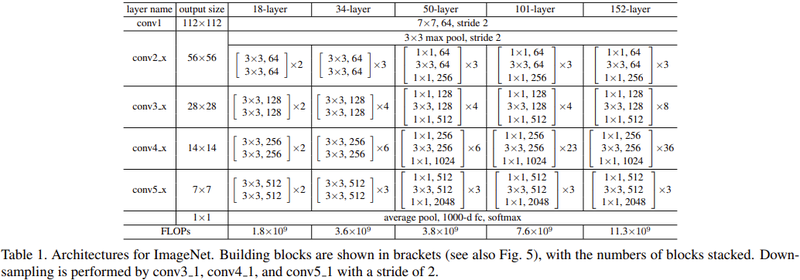

- 공통점 : conv block이라고 불리는 블록 구조를 각각 3, 4, 6, 3개씩 반복해서 쌓은 형태
- 차이점 : ResNet-34와 ResNet-50의 블록 내부 구성은 약간 다름. 
    - ResNet-34 : 3x3 kernel인 Convolution layer로만 구성
    - ResNet-50 : 1x1 Convolution이 앞뒤로 붙어 더 많은 레이어를 한 블록내에 가지게 됨


### ResNet-34 모델
---

우선 기본 블럭만 만들고 input lyaer(maxpooling포함), Output layer(softmax 포함)은 나중에 클래스로 묶을 때 따로 만들기로 하자. 

In [3]:
############ ResNet 34 Block 만들기 ####################
def build_34_layer_block(input_layer,
                          num_cnn = 3,
                          channel = 64,
                          block_num = 1,
                          strides = 1,
                          is_residual = True):
    
    #입력 레이어
    x = input_layer

    #CNN 레이어
    for cnn_num in range(num_cnn):
        #identity mapping 설정
        identity_mapping = x
        ########### layer1 ##############
        # conv2D residual을 더해야하기때문에 padding = 'same'으로 맞춰줌
        x = keras.layers.Conv2D(filters = channel,
                                kernel_size = (3,3),
                                strides = strides,
                                kernel_initializer = 'he_normal',
                                padding = 'same',
                                name = f'block{block_num}_conv{cnn_num}'
                                )(x)
                                
        # conv2D 다음 Batch normalization
        x = keras.layers.BatchNormalization()(x)
        # BN 다음 activation(relu)
        x = keras.layers.Activation('relu')(x)

        ########### layer2 ##############
        # conv2D
        x = keras.layers.Conv2D(filters = channel,
                                strides = 1,
                                kernel_size = (3,3),
                                kernel_initializer = 'he_normal',
                                padding = 'same',
                                name = f'blcok{block_num}_conv{cnn_num}'
                                )(x)
        # conv2D 다음 Batch normalization
        x = keras.layers.BatchNormalization()(x)

        if is_residual:
            ########### skip connection #############
           if strides != 1 :
                # identity mapping conv 진행
                identity_mapping = keras.layers.Conv2D(filters = channel,
                                                    kernel_size = (1,1),
                                                    strides = 2)(identity_mapping)
                # conv2D 다음 Batch normalization
                identity_mapping = keras.layers.BatchNormalization()(identity_mapping)
                # 다음 스텝용 strides 변경
                srides = 1

           ########### Shortcut connection ##############
           #identity mapping 더해주는 레이어
           x = keras.layers.Add()([x, identity_mapping])
           # Add 후 activation(relu)

        x = keras.layers.Activation('relu')(x)


    return x


Ok.... 우선 블럭 1개짜리는 잘 생성되었습니다!!!

그럼 이제 input에서 maxpooling과 나머지 블록들까지 합쳐서 ResNet 34 model을 만들어 봅시다. 

In [4]:
############ ResNet 34 Model 만들기 ####################
def build_resnet_34(input_shape = (32,32,3),
                 num_cnn_list = [3,4,6,3],
                 channel_list = [64,128,256,512],
                 num_classes = 10,
                 is_residual = True):
    
    # 모델 돌리기 전에 config list 길이 확인
    assert len(num_cnn_list) == len(channel_list)


    ############ input layer 생성 ###########
    input_layer = keras.layers.Input(shape = input_shape, name = 'InputLayer')
    output = keras.layers.Conv2D(filters = channel_list[0],
                                 kernel_size = (1,1),
                                 strides = 2,
                                 kernel_initializer = 'he_normal',
                                 padding = 'same',
                                 name = 'conv2D_1st')(input_layer)
    output = keras.layers.BatchNormalization()(output)
    output = keras.layers.Activation('relu')(output)

    # maxpooling
    output = keras.layers.MaxPool2D(pool_size=(1, 1),
                               strides = 2)(output)
    
    ############# Conv layer 생성 ###############
    #config list 길이만큼 반복해서 블록 생성 
    prev_channel = channel_list[0]
    for i, (num_cnn, channel) in enumerate(zip(num_cnn_list, channel_list)):
        #채널이 변할때 stride 변화
        strides = 1 if channel == prev_channel else 2
        output = build_34_layer_block(output,
                                       num_cnn = num_cnn,
                                       channel = channel,
                                       strides = strides,
                                       block_num = i)
        prev_channel = channel

    ############# Dense layer 생성 ################
    output = keras.layers.AveragePooling2D(pool_size=(1, 1),
                                           strides= 1,
                                           padding= 'same',
                                           name = 'Last_Pooling')(output)
    output = keras.layers.Flatten(name = 'Flatten')(output)
    output = keras.layers.Dense(num_classes, activation = 'softmax', name = 'predictions')(output)

    ############# model 생성 ###############
    model = keras.Model(inputs = input_layer,
                        outputs = output)
    
    return model



In [5]:
resnet_34 = build_resnet_34(input_shape=(32,32,3))
resnet_34.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 InputLayer (InputLayer)        [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 conv2D_1st (Conv2D)            (None, 16, 16, 64)   256         ['InputLayer[0][0]']             
                                                                                                  
 batch_normalization (BatchNorm  (None, 16, 16, 64)  256         ['conv2D_1st[0][0]']             
 alization)                                                                                       
                                                                                                  
 activation (Activation)        (None, 16, 16, 64)   0           ['batch_normalization[0][0]']

### ResNet 50
---


In [6]:
############ ResNet 50 Block 만들기 ####################
def build_50_layer_block(input_layer,
                          num_cnn = 3,
                          channel = 64,
                          block_num = 1,
                          strides = 1,
                          is_residual = True):
    
    #입력 레이어
    x = input_layer
    
    #CNN 레이어
    for cnn_num in range(num_cnn):
        #identity mapping 설정
        identity_mapping = x

        ########### layer1 ##############
        # conv2D residual을 더해야하기때문에 padding = 'same'으로 맞춰줌
        x = keras.layers.Conv2D(filters = channel,
                                kernel_size = (1,1),
                                strides = strides,
                                kernel_initializer = 'he_normal',
                                padding = 'same',
                                name = f'block{block_num}_conv{cnn_num}_1x1_1st'
                                )(x)
                                
        # conv2D 다음 BN-ReLU
        x = keras.layers.BatchNormalization()(x)
        x = keras.layers.Activation('relu')(x)

        ########### layer2 ##############
        # conv2D
        x = keras.layers.Conv2D(filters = channel,
                                strides = 1,
                                kernel_size = (3,3),
                                kernel_initializer = 'he_normal',
                                padding = 'same',
                                name = f'blcok{block_num}_conv{cnn_num}_3x3'
                                )(x)
        x = keras.layers.BatchNormalization()(x)
        x = keras.layers.Activation('relu')(x)

        ########### layer3 ##############
        # conv2D residual을 더해야하기때문에 padding = 'same'으로 맞춰줌
        x = keras.layers.Conv2D(filters = (channel * 4),
                                kernel_size = (1,1),
                                strides = 1,
                                kernel_initializer = 'he_normal',
                                padding = 'same',
                                name = f'block{block_num}_conv{cnn_num}_1x1_2nd'
                                )(x)
        # conv2D 다음 BN
        x = keras.layers.BatchNormalization()(x)
        if is_residual:
            if strides == 1: 
                identity_mapping = keras.layers.Conv2D(filters = (channel * 4),
                                                        kernel_size = (1,1),
                                                        padding = 'same',
                                                        strides = strides)(identity_mapping)
                # conv2D 다음 BN
                identity_mapping = keras.layers.BatchNormalization()(identity_mapping)

            ########### skip connections #############
            else:
                # identity mapping conv 진행
                identity_mapping = keras.layers.Conv2D(filters = (channel * 4),
                                                        kernel_size = (1,1),
                                                        strides = 2)(identity_mapping)
                # conv2D 다음 Batch normalization
                identity_mapping = keras.layers.BatchNormalization()(identity_mapping)
                # 다음 스텝용 strides 변경
                strides = 1

            ########### Residual addition ##############
            #identity mapping 더해주는 레이어
            x = keras.layers.Add()([x, identity_mapping])
        # Add 후 activation(relu)
        x = keras.layers.Activation('relu', name = f'block{block_num}_conv{cnn_num}_out')(x)

    return x


In [7]:
############ ResNet 50 Model 만들기 ####################
def build_resnet_50(input_shape = (32,32,3),
                 num_cnn_list = [3,4,6,3],
                 channel_list = [64,128,256,512],
                 num_classes = 10):
    
    # 모델 돌리기 전에 config list 길이 확인
    assert len(num_cnn_list) == len(channel_list)

    ############ input layer 생성 ###########
    input_layer = keras.layers.Input(shape = input_shape, name = 'InputLayer')
    output = keras.layers.Conv2D(filters = channel_list[0],
                                 kernel_size = (1,1),
                                 strides = 2,
                                 kernel_initializer = 'he_normal',
                                 padding = 'same',
                                 name = 'conv2D_1st')(input_layer)
    output = keras.layers.BatchNormalization()(output)
    output = keras.layers.Activation('relu')(output)
    # maxpooling
    output = keras.layers.MaxPool2D(pool_size=(1, 1),
                               strides = 2)(output)
    
    ############# Conv layer 생성 ###############
    #config list 길이만큼 반복해서 블록 생성 
    prev_channel = channel_list[0]
    for i, (num_cnn, channel) in enumerate(zip(num_cnn_list, channel_list)):
        strides = 1 if channel == prev_channel else 2
        output = build_50_layer_block(output,
                                       num_cnn = num_cnn,
                                       channel = channel,
                                       strides = strides,
                                       block_num = i)
        prev_channel = channel
        

    ############# Dense layer 생성 ################
    output = keras.layers.AveragePooling2D(pool_size=(1, 1),
                                           strides= 1,
                                           padding= 'same',
                                           name = 'Last_Pooling')(output)
    output = keras.layers.Flatten(name = 'Flatten')(output)
    output = keras.layers.Dense(num_classes, activation = 'softmax', name = 'predictions')(output)

    ############# model 생성 ###############
    model = keras.Model(inputs = input_layer,
                        outputs = output)
    
    return model

In [8]:
resnet_50 = build_resnet_50()

resnet_50.summary()


tf.keras.utils.plot_model(resnet_50, 'model.png', show_shapes = True)

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 InputLayer (InputLayer)        [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 conv2D_1st (Conv2D)            (None, 16, 16, 64)   256         ['InputLayer[0][0]']             
                                                                                                  
 batch_normalization_46 (BatchN  (None, 16, 16, 64)  256         ['conv2D_1st[0][0]']             
 ormalization)                                                                                    
                                                                                                  
 activation_33 (Activation)     (None, 16, 16, 64)   0           ['batch_normalization_46[0]

In [9]:
############## build_resnet ##############
def build_resnet(input_shape, num_classes, is_50):
    
    num_cnn_list = [3,4,6,3]
    channel_list = [64,128,256,512]

    # 50 일때 
    if is_50 :

        # 모델 돌리기 전에 config list 길이 확인
        assert len(num_cnn_list) == len(channel_list)
        
        ############ input layer 생성 ###########
        input_layer = keras.layers.Input(shape = input_shape, name = 'InputLayer')
        output = keras.layers.Conv2D(filters = channel_list[0],
                                    kernel_size = (1,1),
                                    strides = 2,
                                    kernel_initializer = 'he_normal',
                                    padding = 'same',
                                    name = 'conv2D_1st')(input_layer)
        output = keras.layers.BatchNormalization()(output)
        output = keras.layers.Activation('relu')(output)
        # maxpooling
        output = keras.layers.MaxPool2D(pool_size=(1, 1),
                                strides = 2)(output)

        #config list 길이만큼 반복해서 블록 생성 
        prev_channel = channel_list[0]

        for i, (num_cnn, channel) in enumerate(zip(num_cnn_list, channel_list)):
            strides = 1 if channel == prev_channel else 2
            output = build_50_layer_block(output,
                                        num_cnn = num_cnn,
                                        channel = channel,
                                        strides = strides,
                                        block_num = i)
            prev_channel = channel

    else:
        # 모델 돌리기 전에 config list 길이 확인
        assert len(num_cnn_list) == len(channel_list)

        ############ input layer 생성 ###########
        input_layer = keras.layers.Input(shape = input_shape, name = 'InputLayer')
        output = keras.layers.Conv2D(filters = channel_list[0],
                                    kernel_size = (1,1),
                                    strides = 2,
                                    kernel_initializer = 'he_normal',
                                    padding = 'same',
                                    name = 'conv2D_1st')(input_layer)
        output = keras.layers.BatchNormalization()(output)
        output = keras.layers.Activation('relu')(output)
        # maxpooling
        output = keras.layers.MaxPool2D(pool_size=(1, 1),
                                strides = 2)(output)
                                       
        prev_channel = channel_list[0]
        for i, (num_cnn, channel) in enumerate(zip(num_cnn_list, channel_list)):
            strides = 1 if channel == prev_channel else 2
            output = build_34_layer_block(output,
                                        num_cnn = num_cnn,
                                        channel = channel,
                                        strides = strides,
                                        block_num = i)
            prev_channel = channel

        
    ############# Dense layer 생성 ################
    output = keras.layers.AveragePooling2D(pool_size=(1, 1),
                                           strides= 1,
                                           padding= 'same',
                                           name = 'Last_Pooling')(output)
    output = keras.layers.Flatten(name = 'Flatten')(output)
    output = keras.layers.Dense(num_classes, activation = 'softmax', name = 'predictions')(output)

    ############# model 생성 ###############
    model = keras.Model(inputs = input_layer,
                        outputs = output)
    
    return model



Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 InputLayer (InputLayer)        [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 conv2D_1st (Conv2D)            (None, 16, 16, 64)   256         ['InputLayer[0][0]']             
                                                                                                  
 batch_normalization_111 (Batch  (None, 16, 16, 64)  256         ['conv2D_1st[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_66 (Activation)     (None, 16, 16, 64)   0           ['batch_normalization_111[0

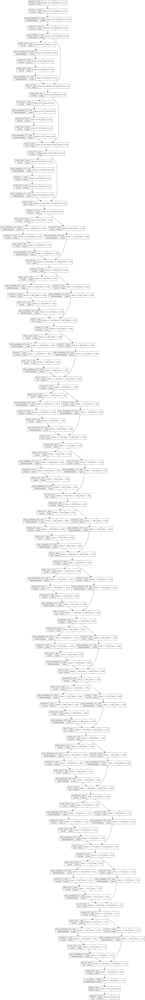

In [10]:
resnet_34 = build_resnet(input_shape=(32, 32,3), num_classes = 10, is_50 =False)
resnet_34.summary()

tf.keras.utils.plot_model(resnet_34, 'model.png', show_shapes = True)

In [11]:
resnet_50 = build_resnet(input_shape=(32, 32,3), num_classes = 10, is_50 = True)
resnet_50.summary()

tf.keras.utils.plot_model(resnet_50, 'model.png', show_shapes = True)

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 InputLayer (InputLayer)        [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 conv2D_1st (Conv2D)            (None, 16, 16, 64)   256         ['InputLayer[0][0]']             
                                                                                                  
 batch_normalization_157 (Batch  (None, 16, 16, 64)  256         ['conv2D_1st[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_99 (Activation)     (None, 16, 16, 64)   0           ['batch_normalization_157[0

ResNet 모델들을 하나의 함수로 묶어 is_50 변수의 True, False로 변환하도록 만들었다. 그럼 plain모델도 이렇게 진행하도록 해보자! 

사실 기본 모델을 만들때 is_residual 변수를 넣어 plain의 on/off를 가능하게 만들었기때문에 간단히 진행 될 수 있을 거라 예상한다.

In [12]:
############## build_plane net ##############
def build_plainnet(input_shape, num_classes, is_50):
    num_cnn_list = [3,4,6,3]
    channel_list = [64,128,256,512]

    # 50 일때 
    if is_50 :

        # 모델 돌리기 전에 config list 길이 확인
        assert len(num_cnn_list) == len(channel_list)
        
        ############ input layer 생성 ###########
        input_layer = keras.layers.Input(shape = input_shape, name = 'InputLayer')
        output = keras.layers.Conv2D(filters = channel_list[0],
                                    kernel_size = (1,1),
                                    strides = 2,
                                    kernel_initializer = 'he_normal',
                                    padding = 'same',
                                    name = 'conv2D_1st')(input_layer)
        output = keras.layers.BatchNormalization()(output)
        output = keras.layers.Activation('relu')(output)
        # maxpooling
        output = keras.layers.MaxPool2D(pool_size=(1, 1),
                                strides = 2)(output)

        ############ Block layer ##############
        #config list 길이만큼 반복해서 블록 생성 
        prev_channel = channel_list[0]
        for i, (num_cnn, channel) in enumerate(zip(num_cnn_list, channel_list)):
            strides = 1 if channel == prev_channel else 2
            output = build_50_layer_block(output,
                                        num_cnn = num_cnn,
                                        channel = channel,
                                        strides = strides,
                                        block_num = i,
                                        is_residual = False)
            prev_channel = channel

    else:

        # 모델 돌리기 전에 config list 길이 확인
        assert len(num_cnn_list) == len(channel_list)

        ############ input layer 생성 ###########
        input_layer = keras.layers.Input(shape = input_shape, name = 'InputLayer')
        output = keras.layers.Conv2D(filters = channel_list[0],
                                    kernel_size = (1,1),
                                    strides = 2,
                                    kernel_initializer = 'he_normal',
                                    padding = 'same',
                                    name = 'conv2D_1st')(input_layer)
        output = keras.layers.BatchNormalization()(output)
        output = keras.layers.Activation('relu')(output)
        # maxpooling
        output = keras.layers.MaxPool2D(pool_size=(1, 1),
                                strides = 2)(output)

        ############ Block layer ##############
        prev_channel = channel_list[0]
        for i, (num_cnn, channel) in enumerate(zip(num_cnn_list, channel_list)):
            strides = 1 if channel == prev_channel else 2
            output = build_34_layer_block(output,
                                        num_cnn = num_cnn,
                                        channel = channel,
                                        strides = strides,
                                        block_num = i,
                                        is_residual = False)
            prev_channel = channel

        
    ############# Dense layer 생성 ################
    output = keras.layers.AveragePooling2D(pool_size=(1, 1),
                                           strides= 1,
                                           padding= 'same',
                                           name = 'Last_Pooling')(output)
    output = keras.layers.Flatten(name = 'Flatten')(output)
    output = keras.layers.Dense(num_classes, activation = 'softmax', name = 'predictions')(output)

    ############# model 생성 ###############
    model = keras.Model(inputs = input_layer,
                        outputs = output)
    
    return model

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 InputLayer (InputLayer)     [(None, 32, 32, 3)]       0         
                                                                 
 conv2D_1st (Conv2D)         (None, 16, 16, 64)        256       
                                                                 
 batch_normalization_222 (Ba  (None, 16, 16, 64)       256       
 tchNormalization)                                               
                                                                 
 activation_132 (Activation)  (None, 16, 16, 64)       0         
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 8, 8, 64)         0         
 2D)                                                             
                                                                 
 block0_conv0 (Conv2D)       (None, 8, 8, 64)          3692

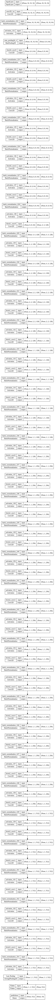

In [13]:
plainnet_34 = build_plainnet(input_shape=(32, 32,3), num_classes = 10, is_50 =False)
plainnet_34.summary()

tf.keras.utils.plot_model(plainnet_34, 'model.png', show_shapes = True)

Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 InputLayer (InputLayer)     [(None, 32, 32, 3)]       0         
                                                                 
 conv2D_1st (Conv2D)         (None, 16, 16, 64)        256       
                                                                 
 batch_normalization_255 (Ba  (None, 16, 16, 64)       256       
 tchNormalization)                                               
                                                                 
 activation_165 (Activation)  (None, 16, 16, 64)       0         
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 8, 8, 64)         0         
 2D)                                                             
                                                                 
 block0_conv0_1x1_1st (Conv2  (None, 8, 8, 64)         4160

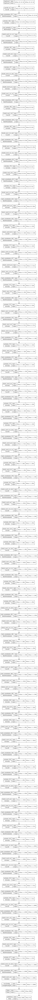

In [14]:
plainnet_50 = build_plainnet(input_shape=(32, 32,3), num_classes = 10, is_50 = True)
plainnet_50.summary()

tf.keras.utils.plot_model(plainnet_50, 'model.png', show_shapes = True)

ResNet과 Plain 모델을 완성했습니다! 

그럼 이제 고양이 멈무미 데이터를 불러와서 학습시켜 비교해봅시다

In [15]:
BATCH_SIZE = 32
EPOCH = 50

In [16]:
(ds_train, ds_test), ds_info = tfds.load(
    'cats_vs_dogs',
    split=['train[:80%]', 'train[80%:]'],
    shuffle_files=True,
    with_info=True,
    as_supervised = True,
)

print(ds_info.features)

FeaturesDict({
    'image': Image(shape=(None, None, 3), dtype=tf.uint8),
    'image/filename': Text(shape=(), dtype=tf.string),
    'label': ClassLabel(shape=(), dtype=tf.int64, num_classes=2),
})


In [17]:
#데이터 갯수도 확인해보자
print(tf.data.experimental.cardinality(ds_train))
print(tf.data.experimental.cardinality(ds_test))

tf.Tensor(18610, shape=(), dtype=int64)
tf.Tensor(4652, shape=(), dtype=int64)


In [18]:
print('label 수: ', ds_info.features['label'].num_classes)
print('label 이름: ', ds_info.features['label'].names)

label 수:  2
label 이름:  ['cat', 'dog']


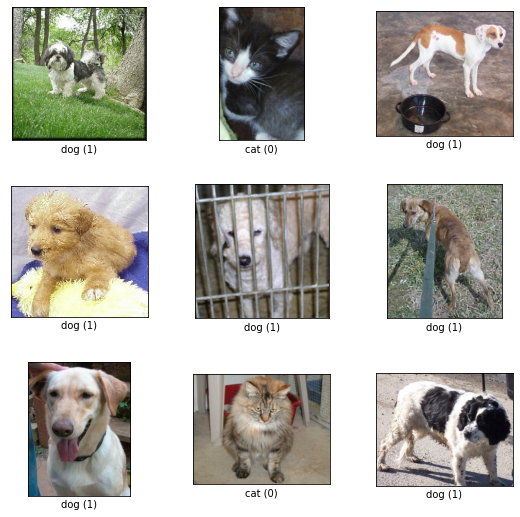

In [19]:
fig = tfds.show_examples(ds_train, ds_info)

귀....귀여워.....ㅎㅎ....   

하지만 각 이미지의 사이즈가 들쑥날쑥한 것을 볼 수 있습니다.  
이미지의 augmentation을 진행해서 과적합을 막아주고 학습을 시켜봅시다.

In [20]:
def resize_and_normalize(image, label):
    """Normalizes images : 'uin8' -> 'float32'.
    우리의 모델에 넣어주기 전에는 각 채널별 최댓값인 255로 정규화(normalize)를 해주어 
    이미지의 표현이 0과 1 사이로 들어오도록 만들어준다.
    """
    image = tf.image.resize(image, [224,224])
    image = tf.cast(image, tf.float32)
    image = tf.divide(image, 255)
    return image, label


In [21]:
def apply_normalize_on_dataset(image_data, is_test = False, batch_size = 16):
    image_data = image_data.map(resize_and_normalize, num_parallel_calls = 1)
    image_data = image_data.batch(batch_size)
    
    if not is_test:
        image_data = image_data.repeat()
        image_data = image_data.shuffle(200)
    
    image_data = image_data.prefetch(tf.data.experimental.AUTOTUNE)
    return image_data

In [22]:
ds_train = apply_normalize_on_dataset(ds_train, batch_size = BATCH_SIZE)
ds_test = apply_normalize_on_dataset(ds_test, batch_size = BATCH_SIZE)

Input에 맞춰 224,224로 맞춰주고 0~1로 정규화를 마치고 dataset까지 만들어주었습니다.   

그럼 이제 plain과 resnet에 서로 넣어 비교해볼까요?

### Plain VS ResNet - 34layers
---

In [23]:
# tensorflow가 활용할 GPU가 장착되어 있는지 확인

tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [24]:
print(device_lib.list_local_devices())

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 15753630002072328197
xla_global_id: -1
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 16154099712
locality {
  bus_id: 1
  links {
  }
}
incarnation: 14332106519689179704
physical_device_desc: "device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0"
xla_global_id: 416903419
]


In [ ]:
################# plainnet 34 model 학습 ########################
plainnet_34 = build_plainnet(input_shape=(224, 224,3), num_classes = 1, is_50 =False)

with tf.device("/device:GPU:0"):
    plainnet_34.compile(
        loss='BinaryCrossentropy',
        optimizer=tf.keras.optimizers.SGD(lr=0.01, clipnorm=1.),
        metrics=['accuracy']
    )

    history_plain34 = plainnet_34.fit(
        ds_train,
        steps_per_epoch=int(ds_info.splits['train[:80%]'].num_examples/BATCH_SIZE),
        validation_steps=int(ds_info.splits['train[80%:]'].num_examples/BATCH_SIZE),
        epochs=EPOCH,
        validation_data=ds_test,
        verbose=1,
        use_multiprocessing=True,
    )

Epoch 1/50
581/581 [==============================] - 74s 87ms/step - loss: 0.7292 - accuracy: 0.4941 - val_loss: 0.8437 - val_accuracy: 0.5117
Epoch 2/50
581/581 [==============================] - 48s 83ms/step - loss: 0.7142 - accuracy: 0.4975 - val_loss: 0.8054 - val_accuracy: 0.5082
Epoch 3/50
581/581 [==============================] - 48s 82ms/step - loss: 0.7100 - accuracy: 0.4971 - val_loss: 0.8393 - val_accuracy: 0.5133
Epoch 4/50
531/581 [==========================>...] - ETA: 3s - loss: 0.7061 - accuracy: 0.4930

In [ ]:
################# ResNet 34 model 학습 ########################
# resnet_34 = build_resnet(input_shape=(224, 224,3), num_classes = 1, is_50 =False)

# resnet_34.compile(
#     loss='BinaryCrossentropy',
#     optimizer=tf.keras.optimizers.SGD(lr=0.01, clipnorm=1.),
#     metrics=['accuracy']
# )

# history_resnet34 = resnet_34.fit(
#     ds_train,
#     steps_per_epoch=int(ds_info.splits['train[:80%]'].num_examples/BATCH_SIZE),
#     validation_steps=int(ds_info.splits['train[80%:]'].num_examples/BATCH_SIZE),
#     epochs=EPOCH,
#     validation_data=ds_test,
#     verbose=1,
#     use_multiprocessing=True,
# )

In [ ]:
plt.plot(history_16.history['loss'], 'r')
plt.plot(history_19.history['loss'], 'b')
plt.title('Model training loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['vgg_16', 'vgg_19'], loc='upper left')
plt.show()

In [ ]:
plt.plot(history_16.history['val_accuracy'], 'r')
plt.plot(history_19.history['val_accuracy'], 'b')
plt.title('Model validation accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['vgg_16', 'vgg_19'], loc='upper left')
plt.show()